In [ ]:
!pip install scanpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.2/104.2 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 7.7 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82807 sha256=acb14739c9cfedaddd754f5ece81b80c790df1c2e4dadb7dd0951fea00a9f6a7
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=723068ca042e540a169548db6a05fbc838cbba072a3522126299f48eb3148774
  Stored in directory: /root/.cache/pip/wheels/6a/aa/

In [ ]:
# Main packages
import scanpy as sc

# other packages
import os


#package.module.function()

# Figure parameters
sc.settings.set_figure_params(dpi=80, facecolor="white")
sc.logging.print_header()

scanpy==1.9.5 anndata==0.9.2 umap==0.5.3 numpy==1.23.5 scipy==1.11.2 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.0 pynndescent==0.5.10


In [ ]:
# Save my Windows folder location into variable using raw string notation which considers as literal characters
filt_folderpath = r"/content/sample_data/New_Project"
print(filt_folderpath)

# Check directory contents
print(os.listdir(filt_folderpath))

# Load files into AnnData object
adata = sc.read_10x_mtx(filt_folderpath, var_names = 'gene_symbols',cache=True)

/content/sample_data/New_Project
['matrix.mtx.gz', 'barcodes.tsv.gz', 'features.tsv.gz']


In [ ]:
adata

AnnData object with n_obs × n_vars = 1549 × 33538
    var: 'gene_ids', 'feature_types'

In [ ]:
print(adata.shape)

(1549, 33538)


In [ ]:
print(adata.obs.info())
print('')
print('##########################################')
print('')
print(adata.var.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1549 entries, AAACCCACAATACGAA-1 to TTTGTTGGTGCTAGCC-1
Empty DataFrame
None

##########################################

<class 'pandas.core.frame.DataFrame'>
Index: 33538 entries, MIR1302-2HG to FAM231C
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   gene_ids       33538 non-null  object
 1   feature_types  33538 non-null  object
dtypes: object(2)
memory usage: 1.8+ MB
None


In [ ]:
# List the cell names
adata.obs

""
AAACCCACAATACGAA-1
AAACCCATCTTGCAAG-1
AAACGAACACTGGACC-1
AAACGAACAGGTGGAT-1
AAACGCTGTCGAACGA-1
...
TTTGGAGCATTCAGGT-1
TTTGGTTAGACTCAAA-1
TTTGGTTAGCATATGA-1
TTTGGTTAGGTCTGGA-1


No charts were generated by quickchart


In [ ]:
# List the cell names
adata.obs.head()

""
AAACCCACAATACGAA-1
AAACCCATCTTGCAAG-1
AAACGAACACTGGACC-1
AAACGAACAGGTGGAT-1
AAACGCTGTCGAACGA-1


In [ ]:
# List the gene names
adata.var

,gene_ids,feature_types
MIR1302-2HG,ENSG00000243485,Gene Expression
FAM138A,ENSG00000237613,Gene Expression
OR4F5,ENSG00000186092,Gene Expression
AL627309.1,ENSG00000238009,Gene Expression
AL627309.3,ENSG00000239945,Gene Expression
...,...,...
AC233755.2,ENSG00000277856,Gene Expression
AC233755.1,ENSG00000275063,Gene Expression
AC240274.1,ENSG00000271254,Gene Expression
AC213203.1,ENSG00000277475,Gene Expression


In [ ]:
if 'feature_types' in adata.var.columns:
    # Drop the "feature_types" column
    adata.var.drop(columns='feature_types', inplace=True)


In [ ]:
adata.var

,gene_ids
MIR1302-2HG,ENSG00000243485
FAM138A,ENSG00000237613
OR4F5,ENSG00000186092
AL627309.1,ENSG00000238009
AL627309.3,ENSG00000239945
...,...
AC233755.2,ENSG00000277856
AC233755.1,ENSG00000275063
AC240274.1,ENSG00000271254
AC213203.1,ENSG00000277475


In [ ]:
# AnnData stores sparse data in Compressed Sparse Row matrix which are memory efficient instead of large 2-d matrices.
# https://cmdlinetips.com/2018/03/sparse-matrices-in-python-with-scipy/
adata.X

<1549x33538 sparse matrix of type '<class 'numpy.float32'>'
	with 4517393 stored elements in Compressed Sparse Row format>

In [ ]:
# Note:
    # Cells by genes in Scanpy
    # Genes by cells in Seurat

# create a shallow dataframe (No changes to original dataframe)

adata.to_df()


,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,AC007325.2,BX072566.1,AL354822.1,AC023491.2,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C
AAACCCACAATACGAA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCATCTTGCAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGAACACTGGACC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGAACAGGTGGAT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACGCTGTCGAACGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCATTCAGGT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
TTTGGTTAGACTCAAA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
TTTGGTTAGCATATGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGGTTAGGTCTGGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


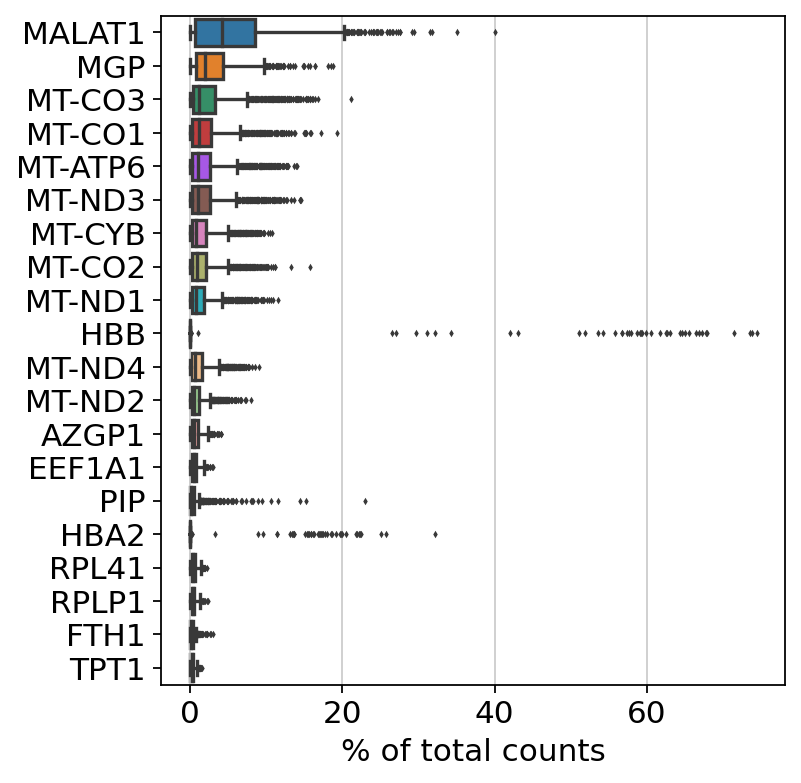

In [ ]:
# The n_top genes with the highest mean fraction over all cells

sc.pl.highest_expr_genes(adata, n_top=20)

In [ ]:
# copy into a new AnnData object "adata_wQC"
adata_wQC = adata.copy()
sc.pp.calculate_qc_metrics(adata_wQC, percent_top=None, log1p=False, inplace=True)

In [ ]:
adata

AnnData object with n_obs × n_vars = 1549 × 33538
    var: 'gene_ids'

In [ ]:
# This dataframe now contains:
#                    1) X matrix with n_obs × n_vars = 2700 × 32738
#                    2) obs: 'n_genes_by_counts', 'total_counts'
#                    3) var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

adata_wQC

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [ ]:
# n_genes_by_counts - The number of genes with at least 1 count in a cell
# total_counts - Total number of counts for a cell

adata_wQC.obs

,n_genes_by_counts,total_counts
AAACCCACAATACGAA-1,390,610.0
AAACCCATCTTGCAAG-1,4362,17887.0
AAACGAACACTGGACC-1,427,736.0
AAACGAACAGGTGGAT-1,1245,2011.0
AAACGCTGTCGAACGA-1,346,507.0
...,...,...
TTTGGAGCATTCAGGT-1,7445,53437.0
TTTGGTTAGACTCAAA-1,5386,18436.0
TTTGGTTAGCATATGA-1,171,1205.0
TTTGGTTAGGTCTGGA-1,2454,7724.0


In [ ]:
adata_wQC.var

,gene_ids,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
MIR1302-2HG,ENSG00000243485,0,0.000000,100.000000,0.0
FAM138A,ENSG00000237613,0,0.000000,100.000000,0.0
OR4F5,ENSG00000186092,0,0.000000,100.000000,0.0
AL627309.1,ENSG00000238009,22,0.015494,98.579729,24.0
AL627309.3,ENSG00000239945,2,0.001291,99.870884,2.0
...,...,...,...,...,...
AC233755.2,ENSG00000277856,0,0.000000,100.000000,0.0
AC233755.1,ENSG00000275063,0,0.000000,100.000000,0.0
AC240274.1,ENSG00000271254,233,0.259522,84.958037,402.0
AC213203.1,ENSG00000277475,0,0.000000,100.000000,0.0


In [ ]:
adata_wQC.var_names

Index(['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3',
       'AL627309.2', 'AL627309.4', 'AL732372.1', 'OR4F29', 'AC114498.1',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231C'],
      dtype='object', length=33538)

In [ ]:
adata_wQC.var_names.str.startswith('MT-')

array([False, False, False, ..., False, False, False])

In [ ]:
# annotate mitochondrial genes as 'mt' and calculate qc metrics
adata_wQC.var['mt'] = adata_wQC.var_names.str.startswith('MT-') # creates a new column in var dataframe with boolean values for gene names that start with MT
adata_wQC

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'

In [ ]:
# print mt column
adata_wQC.var['mt']

MIR1302-2HG    False
FAM138A        False
OR4F5          False
AL627309.1     False
AL627309.3     False
               ...  
AC233755.2     False
AC233755.1     False
AC240274.1     False
AC213203.1     False
FAM231C        False
Name: mt, Length: 33538, dtype: bool

In [ ]:
# print var dataframe columns
adata_wQC.var

,gene_ids,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,mt
MIR1302-2HG,ENSG00000243485,0,0.000000,100.000000,0.0,False
FAM138A,ENSG00000237613,0,0.000000,100.000000,0.0,False
OR4F5,ENSG00000186092,0,0.000000,100.000000,0.0,False
AL627309.1,ENSG00000238009,22,0.015494,98.579729,24.0,False
AL627309.3,ENSG00000239945,2,0.001291,99.870884,2.0,False
...,...,...,...,...,...,...
AC233755.2,ENSG00000277856,0,0.000000,100.000000,0.0,False
AC233755.1,ENSG00000275063,0,0.000000,100.000000,0.0,False
AC240274.1,ENSG00000271254,233,0.259522,84.958037,402.0,False
AC213203.1,ENSG00000277475,0,0.000000,100.000000,0.0,False


In [ ]:
sc.pp.calculate_qc_metrics(adata_wQC, percent_top=None, log1p=False, inplace=True) #,

In [ ]:
adata_wQC

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'n_genes_by_counts', 'total_counts'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'

In [ ]:
sc.pp.calculate_qc_metrics(adata_wQC, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [ ]:
adata_wQC

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'

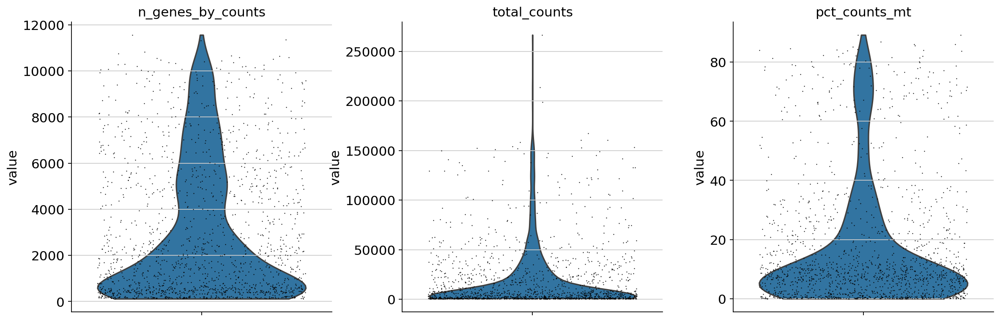

In [ ]:
# plot a violin plot with some QC metrics
sc.pl.violin(adata_wQC, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

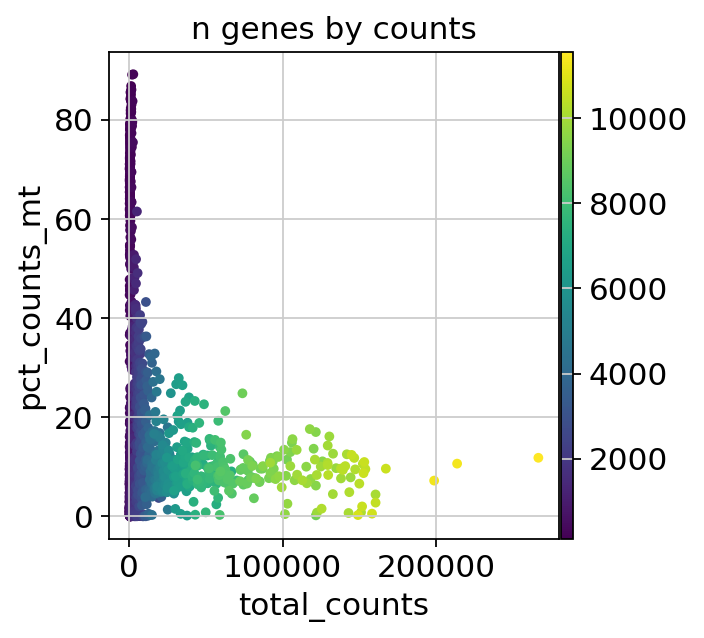

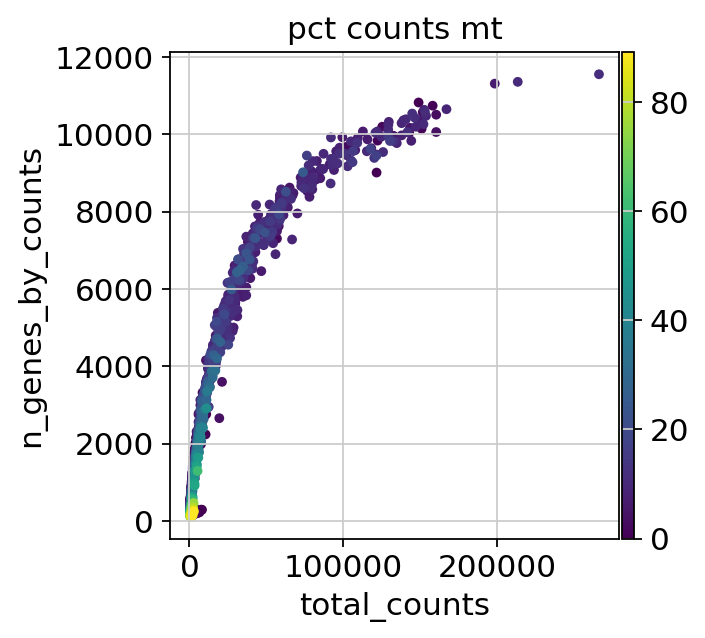

In [ ]:
sc.pl.scatter(adata_wQC, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')
sc.pl.scatter(adata_wQC, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')

In [ ]:
# copy into a new AnnData object "adata_wQC_filt"
adata_wQC_filt = adata_wQC.copy()
print(adata_wQC)
sc.pp.filter_cells(adata_wQC_filt, min_genes=3000)
print(adata_wQC_filt)
adata_wQC_filt = adata_wQC_filt[adata_wQC_filt.obs.pct_counts_mt < 20, :]
print(adata_wQC_filt)

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'
AnnData object with n_obs × n_vars = 550 × 33538
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'
View of AnnData object with n_obs × n_vars = 510 × 33538
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'


In [ ]:
print(adata_wQC_filt)
adata_wQC_filt = adata_wQC_filt[adata_wQC_filt.obs.n_genes_by_counts < 2500, :]
print(adata_wQC_filt)

View of AnnData object with n_obs × n_vars = 550 × 33538
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'
View of AnnData object with n_obs × n_vars = 0 × 33538
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'


In [ ]:
print(adata_wQC_filt)
sc.pp.filter_genes(adata_wQC_filt, min_cells=3)
print(adata_wQC_filt)

View of AnnData object with n_obs × n_vars = 510 × 33538
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt'
AnnData object with n_obs × n_vars = 510 × 19053
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


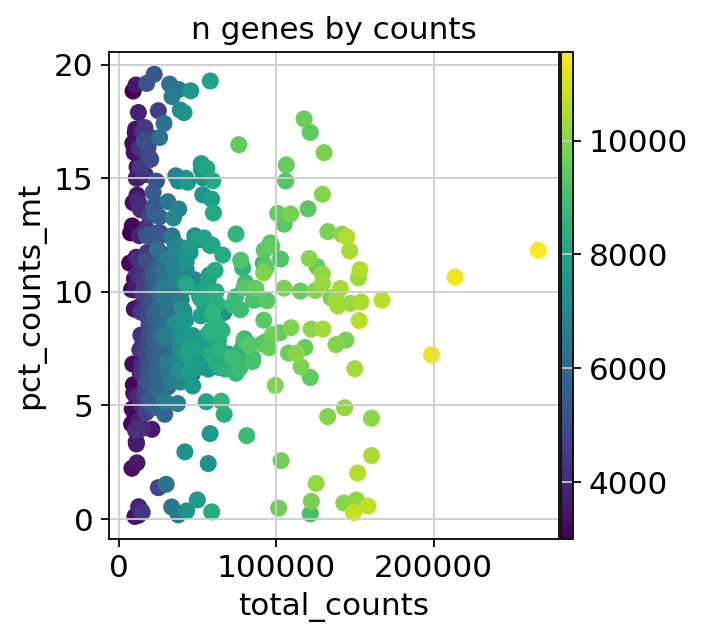

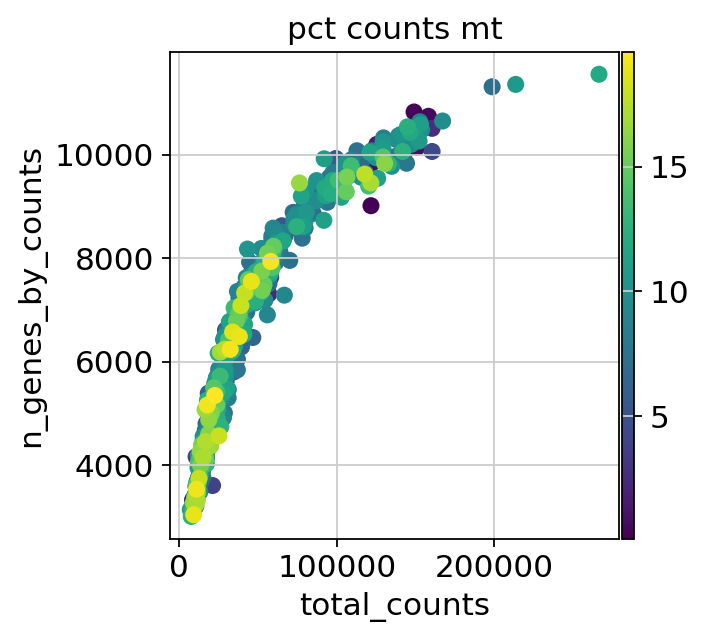

In [ ]:
sc.pl.scatter(adata_wQC_filt, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')
sc.pl.scatter(adata_wQC_filt, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')

In [ ]:
# copy into a new AnnData object "norm_data"
norm_data = adata_wQC_filt.copy()

sc.pp.normalize_total(norm_data, target_sum=1e4)
norm_data

AnnData object with n_obs × n_vars = 510 × 19053
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'

In [ ]:
#log n+1 transform
sc.pp.log1p(norm_data)

In [ ]:
norm_data

AnnData object with n_obs × n_vars = 510 × 19053
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'
    uns: 'log1p'

In [ ]:
# copy into a new AnnData object "HVG_data"
HVG_data = norm_data.copy()
sc.pp.highly_variable_genes(HVG_data, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [ ]:
print(norm_data)
print("#######################################")
print(HVG_data)

AnnData object with n_obs × n_vars = 510 × 19053
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells'
    uns: 'log1p'
#######################################
AnnData object with n_obs × n_vars = 510 × 19053
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'


In [ ]:
HVG_data.var['highly_variable']

AL627309.1    False
AL627309.4    False
AL669831.2    False
AL669831.5    False
LINC00115      True
              ...  
AC011043.1    False
AL592183.1    False
AC007325.4    False
AL354822.1    False
AC240274.1     True
Name: highly_variable, Length: 19053, dtype: bool

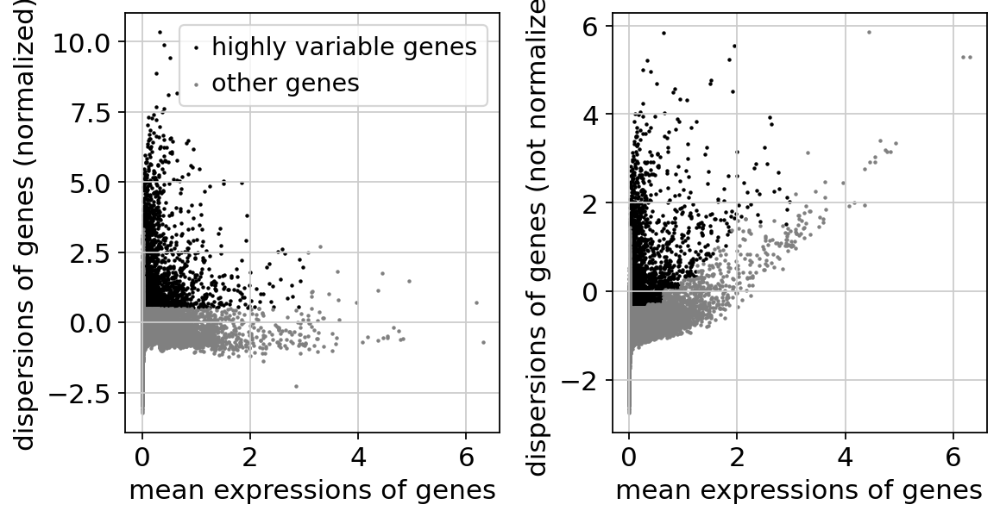

In [ ]:
sc.pl.highly_variable_genes(HVG_data)

In [ ]:
# now we will filter out the highly variable genes
HVG_data = HVG_data[:, HVG_data.var.highly_variable]
HVG_data

View of AnnData object with n_obs × n_vars = 510 × 2541
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

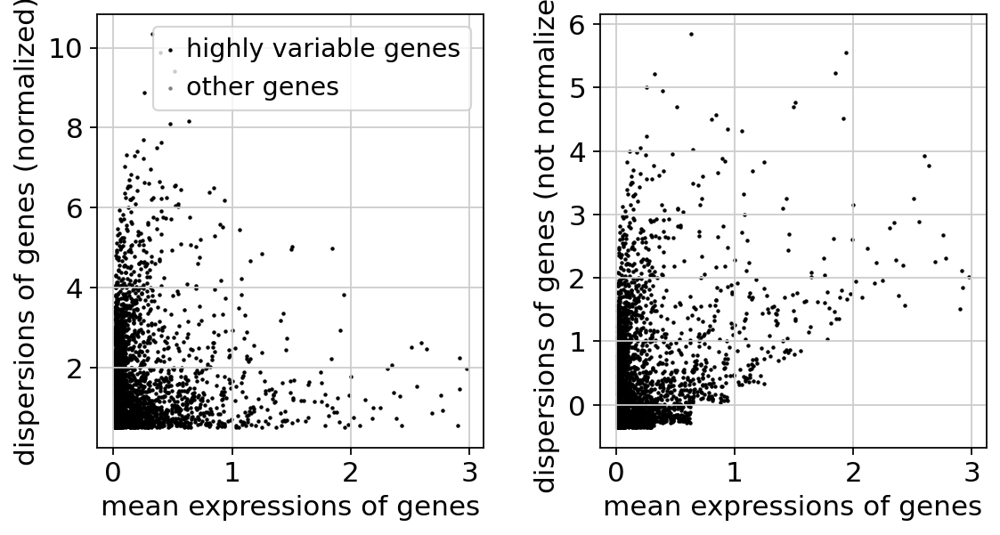

In [ ]:
sc.pl.highly_variable_genes(HVG_data)

In [ ]:
# copy into a new AnnData object "pcHVG_data"
pcHVG_data = HVG_data.copy()

# scale to unit variance for PCA, clip values exceeding standard deviation 10
sc.pp.scale(pcHVG_data, max_value=10)

In [ ]:
print(HVG_data)
print(pcHVG_data)

View of AnnData object with n_obs × n_vars = 510 × 2541
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
AnnData object with n_obs × n_vars = 510 × 2541
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'


In [ ]:
sc.tl.pca(pcHVG_data)

In [ ]:
print(pcHVG_data)

AnnData object with n_obs × n_vars = 510 × 2541
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'


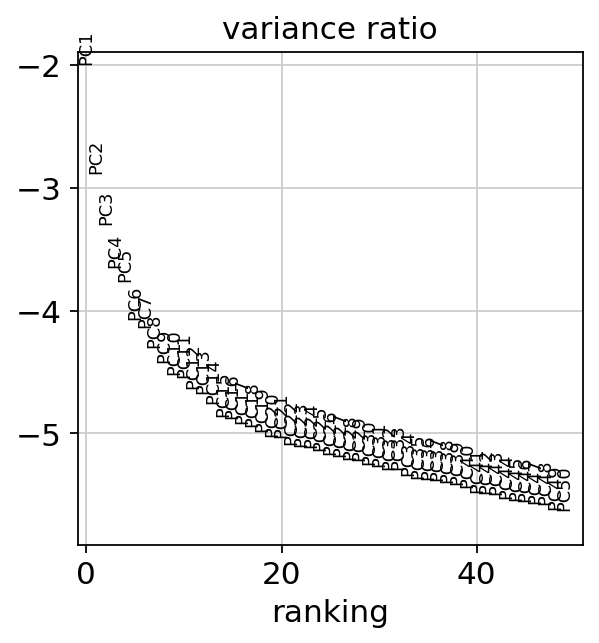

In [ ]:
# We will now plot 50 PCs that are contributing to the variance and choose the number of PCs
# Basically, when the curve starts to flatten that may be roughly be the number of PCs we could choose
sc.pl.pca_variance_ratio(pcHVG_data, log=True, n_pcs=50)

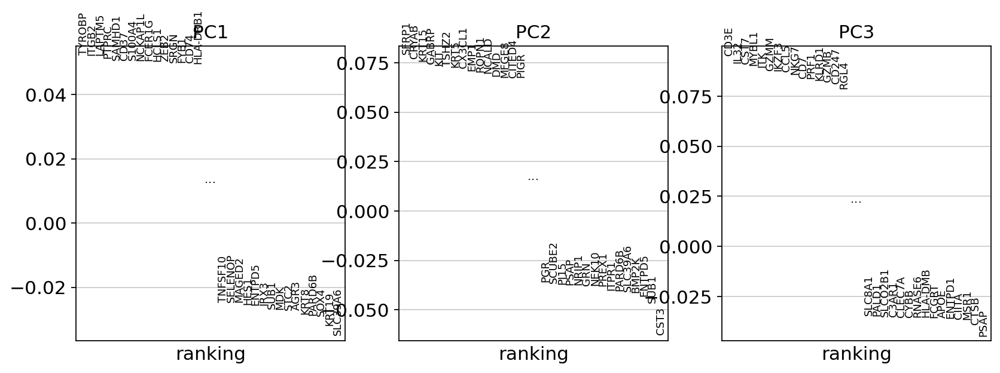

In [ ]:
sc.pl.pca_loadings(pcHVG_data)

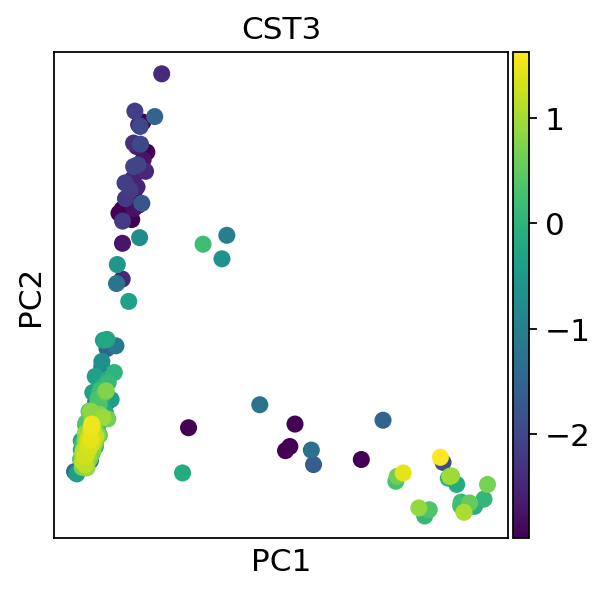

In [ ]:
sc.pl.pca(pcHVG_data, color='CST3')

In [ ]:
sc.pp.neighbors(pcHVG_data, n_pcs=15)

In [ ]:
pcHVG_data

AnnData object with n_obs × n_vars = 510 × 2541
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
pcHVG_data.obsp

PairwiseArrays with keys: distances, connectivities

In [ ]:
# obsp attribute contains two keys: 'distances' and 'connectivities', each key has a value that is a sparse matrix.

for key, value in pcHVG_data.obsp.items():
    print("key: ", key)
    print("value: ", value)

key:  distances
value:    (0, 94)	9.725101470947266
  (0, 120)	9.687691688537598
  (0, 134)	9.213976860046387
  (0, 178)	8.24358081817627
  (0, 179)	11.334760665893555
  (0, 203)	10.798056602478027
  (0, 306)	11.085661888122559
  (0, 307)	10.896336555480957
  (0, 364)	11.692086219787598
  (0, 374)	12.000750541687012
  (0, 400)	10.93858814239502
  (0, 416)	12.706836700439453
  (0, 451)	10.922151565551758
  (0, 509)	12.147135734558105
  (1, 13)	11.802692413330078
  (1, 55)	11.711602210998535
  (1, 80)	10.387354850769043
  (1, 94)	9.479060173034668
  (1, 120)	10.478872299194336
  (1, 144)	11.53625774383545
  (1, 186)	11.521047592163086
  (1, 200)	11.568413734436035
  (1, 287)	10.63071346282959
  (1, 307)	10.376747131347656
  (1, 327)	11.254881858825684
  :	:
  (508, 56)	9.871637344360352
  (508, 73)	8.605050086975098
  (508, 98)	9.830066680908203
  (508, 128)	9.282073974609375
  (508, 146)	7.052420616149902
  (508, 174)	9.828638076782227
  (508, 216)	9.678178787231445
  (508, 255)	5.55747

In [ ]:
umHVG_data = pcHVG_data.copy()
sc.tl.umap(umHVG_data)

In [ ]:
umHVG_data

AnnData object with n_obs × n_vars = 510 × 2541
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes'
    var: 'gene_ids', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mt', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
print(umHVG_data.obsm['X_pca'])

[[-1.3406789e+00  4.3265638e+00 -4.3722579e-01 ...  5.3798647e+00
  -7.0048661e+00 -2.1509233e+00]
 [-2.1384203e+00  4.3819737e+00 -1.4546545e+00 ... -7.0667458e-01
   7.8558576e-01  9.7526634e-01]
 [-6.0294852e+00 -6.0018754e+00 -1.5830836e+00 ... -4.0024376e-01
  -3.0214146e-01  7.7161330e-01]
 ...
 [-6.3052812e+00 -6.7946701e+00  9.0910864e-01 ...  1.8562824e+00
  -3.0942316e+00  3.7991393e-03]
 [-4.8337607e+00  9.6208894e-01 -8.4345406e-01 ... -4.1316724e-01
   1.9500893e+00 -9.6321750e-01]
 [-1.1504230e+00  5.5711761e+00 -9.1697162e-01 ... -2.0782738e+00
  -2.2773399e+00 -3.3268626e+00]]


In [ ]:
print(umHVG_data.obsm['X_umap'])

[[ 4.7270217  8.412129 ]
 [ 5.580346   8.731988 ]
 [ 9.255157   9.889924 ]
 ...
 [13.387685  10.369074 ]
 [ 6.255901   6.1966586]
 [ 4.48999    8.695521 ]]


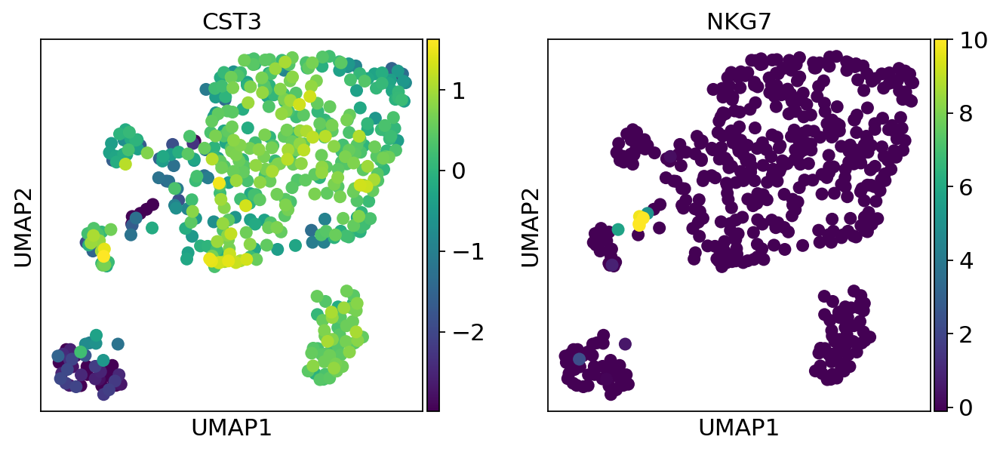

In [ ]:
# the below command will use the data stored in the 'X_umap' by default.
sc.pl.umap(umHVG_data,color=['CST3', 'NKG7'])

In [ ]:
!pip3 install leidenalg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 13.8 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
import scanpy as sc

# Assuming you have already loaded or created your AnnData object (adata)

# Compute the neighbors
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X')  # You can adjust n_neighbors as needed

# Now, you can run the Leiden clustering
sc.tl.leiden(adata)

# Print or inspect the results
print(adata)


AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'leiden'
    var: 'gene_ids'
    uns: 'neighbors', 'leiden'
    obsp: 'distances', 'connectivities'


In [ ]:
# Create a list to store the number of clusters for each resolution
cluster_counts = []

# Set the range of resolution parameters to test
#resolutions = [0.1, 0.2, 0.3, 0.4, 0.5]
resolutions = np.arange(0.1, 2, 0.1)

# Loop through the range of resolution parameters
#for resolution in resolutions:
for resolution in np.arange(0.1, 2, 0.1):
    # Run the Leiden algorithm
    sc.tl.leiden(adata, resolution=resolution)
    # Get the number of clusters
    n_clusters = len(adata.obs['leiden'].unique())
    # Append the number of clusters to the list
    cluster_counts.append(n_clusters)

In [ ]:
cluster_counts

[5, 7, 10, 12, 15, 16, 16, 19, 19, 19, 21, 22, 22, 23, 23, 26, 27, 27, 27]

In [ ]:
adata

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'leiden'
    var: 'gene_ids'
    uns: 'neighbors', 'leiden'
    obsp: 'distances', 'connectivities'

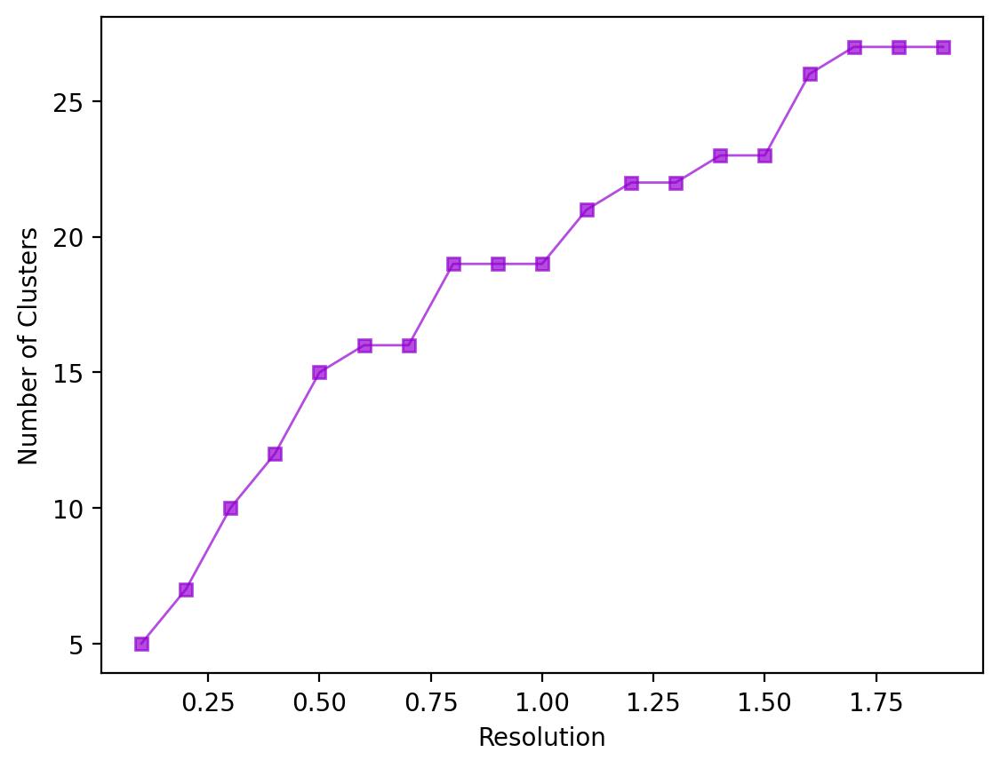

In [ ]:
# Plot the relationship between resolution and number of clusters

plt.style.use('default')
plt.plot(resolutions, cluster_counts,marker='s',alpha=.7, markersize=5, color='darkviolet', linewidth=1)
plt.xlabel('Resolution')
plt.ylabel('Number of Clusters')
plt.show()

In [ ]:
adata

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'leiden'
    var: 'gene_ids'
    uns: 'neighbors', 'leiden'
    obsp: 'distances', 'connectivities'

In [ ]:
# Lets draw the plot for multiple resolutions
sc.tl.leiden(adata, key_added = "leiden_1.0") # default resolution in 1.0
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 1.4, key_added = "leiden_1.4")

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


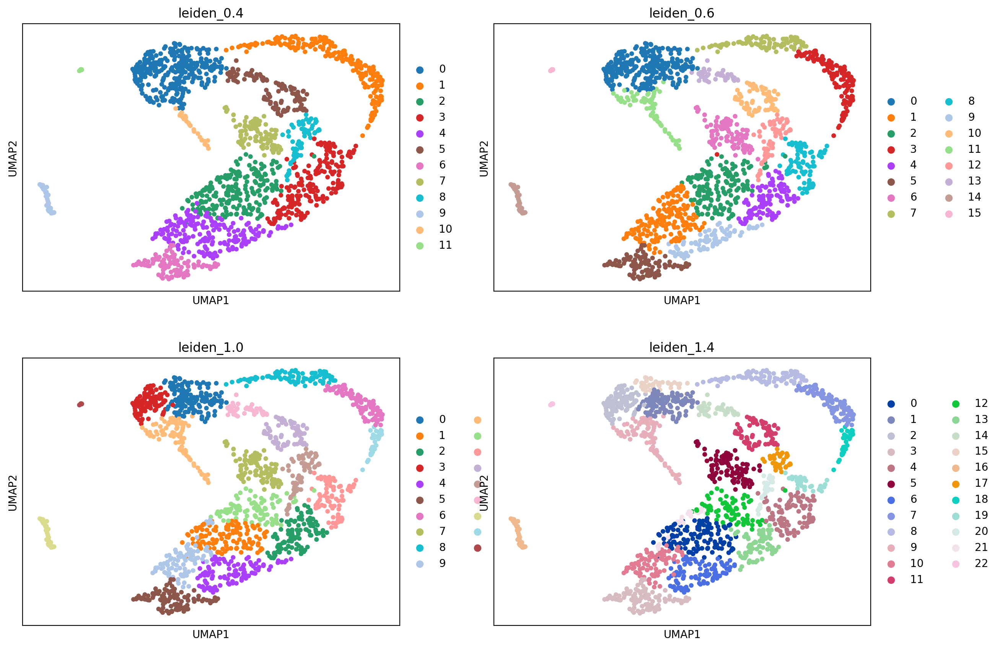

In [ ]:
# Compute UMAP
sc.tl.umap(adata)

# Plot UMAP embeddings with color labels
sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0', 'leiden_1.4'], ncols=2)

# If you want to add additional color annotations, you can do so using the 'color' parameter
# Example: sc.pl.umap(adata, color=['leiden_0.4', 'leiden_0.6', 'leiden_1.0', 'leiden_1.4', 'your_annotation'], ncols=2)

# Show the plot
#sc.pl.show()

In [ ]:
adata

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4'
    var: 'gene_ids'
    uns: 'neighbors', 'leiden', 'umap', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [ ]:
for i in np.arange(0.1, 2, 0.1):
    print(i)
    sc.tl.leiden(adata, resolution=i, key_added = "leiden_"+str(i))
    #sc.pl.umap(clHVG_data, color=['leiden'])

0.1
0.2
0.30000000000000004
0.4
0.5
0.6
0.7000000000000001
0.8
0.9
1.0
1.1
1.2000000000000002
1.3000000000000003
1.4000000000000001
1.5000000000000002
1.6
1.7000000000000002
1.8000000000000003
1.9000000000000001


In [ ]:
adata

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.1', 'leiden_0.2', 'leiden_0.30000000000000004', 'leiden_0.5', 'leiden_0.7000000000000001', 'leiden_0.8', 'leiden_0.9', 'leiden_1.1', 'leiden_1.2000000000000002', 'leiden_1.3000000000000003', 'leiden_1.4000000000000001', 'leiden_1.5000000000000002', 'leiden_1.6', 'leiden_1.7000000000000002', 'leiden_1.8000000000000003', 'leiden_1.9000000000000001'
    var: 'gene_ids'
    uns: 'neighbors', 'leiden', 'umap', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [ ]:
filter_col = [col for col in adata.obs if col.startswith('leiden')]
filter_col

['leiden',
 'leiden_1.0',
 'leiden_0.6',
 'leiden_0.4',
 'leiden_1.4',
 'leiden_0.1',
 'leiden_0.2',
 'leiden_0.30000000000000004',
 'leiden_0.5',
 'leiden_0.7000000000000001',
 'leiden_0.8',
 'leiden_0.9',
 'leiden_1.1',
 'leiden_1.2000000000000002',
 'leiden_1.3000000000000003',
 'leiden_1.4000000000000001',
 'leiden_1.5000000000000002',
 'leiden_1.6',
 'leiden_1.7000000000000002',
 'leiden_1.8000000000000003',
 'leiden_1.9000000000000001']

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanp

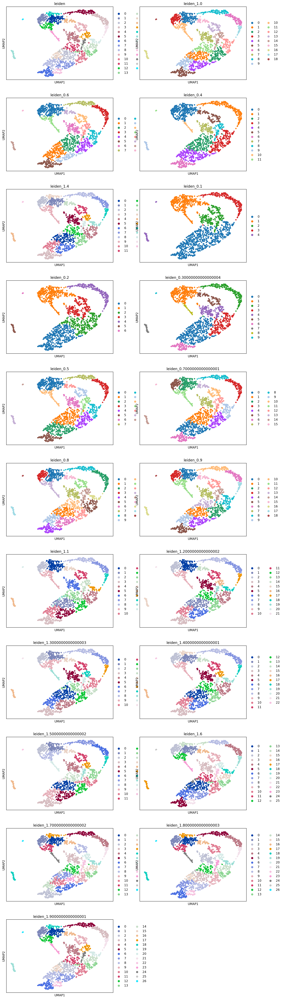

In [ ]:
sc.pl.umap(adata, color=filter_col, ncols=2)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


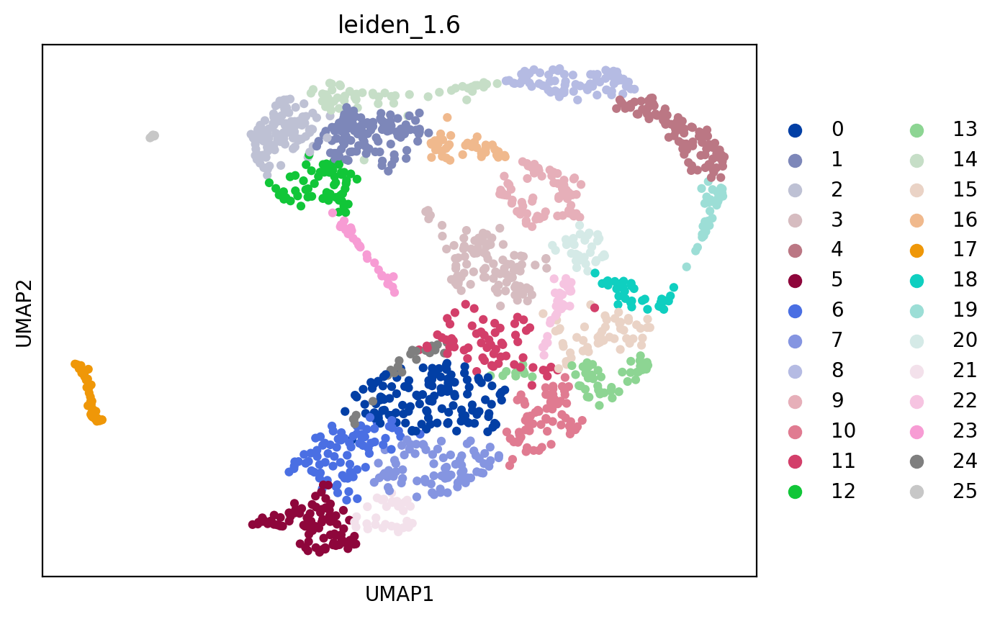

In [ ]:
sc.pl.umap(adata, color=['leiden_1.6'])

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:368: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


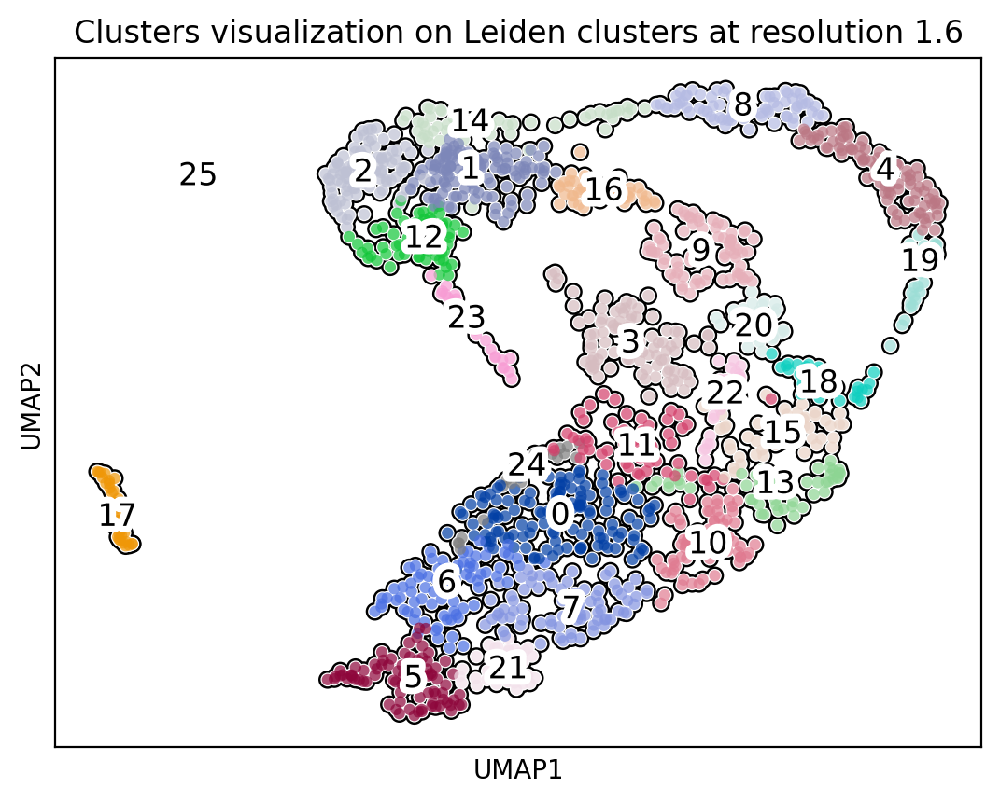

In [ ]:
#plot the UMAP
sc.pl.umap(adata, color=['leiden_1.6'], add_outline=True,
           title='Clusters visualization on Leiden clusters at resolution 1.6',
           legend_loc='on data', #'right margin',
           legend_fontoutline=5, legend_fontweight= 'normal',
           legend_fontsize= 12, outline_width =(0.2, 0.1), frameon=True, save = '_leiden.png')

In [ ]:
### Composition of the clusters

# How many cells are in each cluster

# Useful to decide what resolution value

print(adata.obs['leiden_1.6'].value_counts())

0     130
1     114
2     105
3      93
4      89
5      83
6      79
7      79
8      73
9      72
10     67
11     61
12     58
13     54
14     53
15     49
16     41
17     34
18     33
19     33
20     33
21     31
22     29
23     27
24     22
25      7
Name: leiden_1.6, dtype: int64


/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in

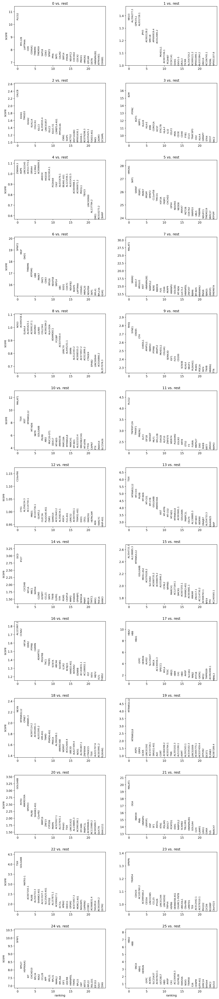

In [ ]:
#using t-test
sc.tl.rank_genes_groups(adata, 'leiden_1.6', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "t-test", ncols=2)

In [ ]:
adata

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.1', 'leiden_0.2', 'leiden_0.30000000000000004', 'leiden_0.5', 'leiden_0.7000000000000001', 'leiden_0.8', 'leiden_0.9', 'leiden_1.1', 'leiden_1.2000000000000002', 'leiden_1.3000000000000003', 'leiden_1.4000000000000001', 'leiden_1.5000000000000002', 'leiden_1.6', 'leiden_1.7000000000000002', 'leiden_1.8000000000000003', 'leiden_1.9000000000000001'
    var: 'gene_ids'
    uns: 'neighbors', 'leiden', 'umap', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', 'leiden_colors', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.30000000000000004_colors', 'leiden_0.5_colors', 'leiden_0.7000000000000001_colors', 'leiden_0.8_colors', 'leiden_0.9_colors', 'leiden_1.1_colors', 'leiden_1.2000000000000002_colors', 'leiden_1.3000000000000003_colors', 'leiden_1.4000000000000001_colors', 'leiden_1.5000000000000002_colors', 'leiden_1.6_

/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in divide
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in expm1
  self.expm1_func(mean_rest) + 1e-9
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: divide by zero encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/usr/local/lib/python3.10/dist-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: overflow encountered in

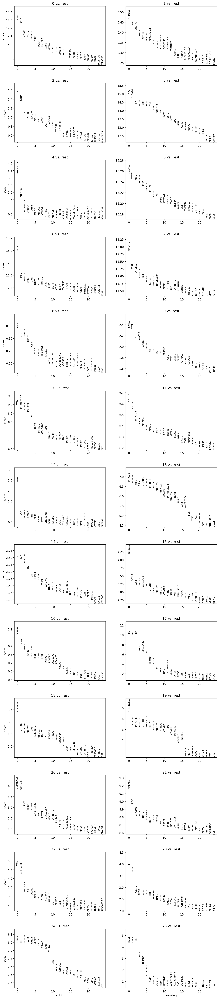

In [ ]:
#using wilcoxon rank-sum test
sc.tl.rank_genes_groups(adata, 'leiden_1.6', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon", ncols=2)

In [ ]:
print(adata)
len(adata.uns['wilcoxon']['names']['0'])

AnnData object with n_obs × n_vars = 1549 × 33538
    obs: 'leiden', 'leiden_1.0', 'leiden_0.6', 'leiden_0.4', 'leiden_1.4', 'leiden_0.1', 'leiden_0.2', 'leiden_0.30000000000000004', 'leiden_0.5', 'leiden_0.7000000000000001', 'leiden_0.8', 'leiden_0.9', 'leiden_1.1', 'leiden_1.2000000000000002', 'leiden_1.3000000000000003', 'leiden_1.4000000000000001', 'leiden_1.5000000000000002', 'leiden_1.6', 'leiden_1.7000000000000002', 'leiden_1.8000000000000003', 'leiden_1.9000000000000001'
    var: 'gene_ids'
    uns: 'neighbors', 'leiden', 'umap', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.4_colors', 'leiden_colors', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.30000000000000004_colors', 'leiden_0.5_colors', 'leiden_0.7000000000000001_colors', 'leiden_0.8_colors', 'leiden_0.9_colors', 'leiden_1.1_colors', 'leiden_1.2000000000000002_colors', 'leiden_1.3000000000000003_colors', 'leiden_1.4000000000000001_colors', 'leiden_1.5000000000000002_colors', 'leiden_1.6_

33538

In [ ]:
# Genes are sorted based on the score for each cluster
# columns names are cluster num
# For example, LTB gene is found to posess highest score in "cluster_0"
pd.DataFrame(adata.uns['wilcoxon']['names'])

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,MGP,PKHD1L1,C1QB,PTPRC,MTRNR2L12,COX7A2,MGP,MALAT1,MSR1,SYNE1,...,CARMN,HBB,MTRNR2L12,MTRNR2L12,ANKRD30A,MALAT1,TSIX,PIP,SFRP1,HBA1
1,PLCG2,IGKC,C1QA,S100A4,MT-ND6,TSTD1,TIMP1,XIST,C1QC,TFPI,...,CCNA2,HBA2,MT-CO2,MT-CO3,GOLGA8B,XIST,GOLGA8B,MGP,KIT,HBA2
2,AZGP1,COL4A1,C1QC,HLA-E,MTRNR2L8,FKBP2,SPINT2,ARGLU1,WDFY4,VIM,...,RGS2,HBA1,MT-ATP6,MT-ATP6,TSIX,ARGLU1,MATR3-1,AZGP1,NDRG2,HBB
3,PDLIM1,RGS5,CALCB,HCST,MT-ND2,POLR2L,UBB,MT-ND6,C3AR1,AKAP12,...,DDR2,SNCA,MT-CYB,MT-CO2,PILRB,NKTR,XIST,TFPI2,GABRP,SNCA
4,SMIM22,NR1I3,HLA-DRA,FYB1,MT-ATP6,PPDPF,H2AFJ,DDX17,RGS5,CALD1,...,AL121987.2,SLC25A37,MT-CO3,MT-CO1,SUGP2,DDX17,MALAT1,SUB1,KRT15,HEMGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33533,CORO1A,MT-ND2,MT-ATP6,ERBB3,SUB1,CD53,WIPF1,FYB1,DDX17,BTF3,...,MT-ND4,MT-CO3,SH3BGRL,RPS3A,MT-ATP6,ETS1,MT-ND5,MT-ND4,MYB,RPL18
33534,LAPTM5,MT-ND4,MT-ND3,ESR1,DDX17,SRGN,FYB1,VIM,SRSF5,SUB1,...,MT-ND1,H3F3B,COX7C,SUB1,MT-CYB,CALD1,MT-CYB,MT-ATP6,ANKRD30A,RPS18
33535,WIPF1,MT-CO1,MT-CO1,DSP,MALAT1,CD37,VIM,LAPTM5,DDX5,RPS15,...,MT-CO2,MT-ATP6,TPT1,HNRNPU,MT-CO2,NTRK2,MT-CO2,MT-ND1,PLAT,RPL7A
33536,SRGN,MT-CO2,MT-CO3,AZGP1,HNRNPA2B1,PTPRC,PTPRC,HCST,H3F3B,SERF2,...,MT-ND2,MT-ND3,UBB,DDX5,MT-ND1,VIM,MT-ND2,MT-CO1,INPP4B,RPL11


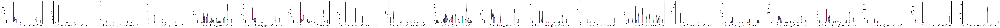

In [ ]:
# visualising the expression levels of marker genes within the cluster of cells also helps with annotation.
sc.pl.violin(adata, ['MGP', 'PKHD1L1', 'C1QB','PTPRC','MTRNR2L12','COX7A2','MGP','MALAT1', 'MSR1', 'SYNE1', 'TSIX', 'TACSTD2', 'MGP','MT-ATP6', 'LTF', 'GOLGA8B', 'AL121987.2', 'SLC25A37', 'MT-CO3', 'MT-CO1', 'MALAT1', 'TSIX', 'PIP', 'SFRP1', 'HBA1' ], groupby='leiden_1.6', ncols=2)


In [ ]:
# save differentially expressed genes (DEGs)  between clusters which are ranked by score
result = adata.uns['wilcoxon']
groups = result['names'].dtype.names
df1 = pd.DataFrame({group+'' + key:result[key][group] for group in groups for key in ['names','scores','logfoldchanges','pvals','pvals_adj']})
df1.head()
#df1.to_csv("scanpy_pbmc_3k_DEGs_between_clusters.csv")

,0names,0scores,0logfoldchanges,0pvals,0pvals_adj,1names,1scores,1logfoldchanges,1pvals,1pvals_adj,...,24names,24scores,24logfoldchanges,24pvals,24pvals_adj,25names,25scores,25logfoldchanges,25pvals,25pvals_adj
0,MGP,12.301670,NaN,8.872091e-35,2.975522e-30,PKHD1L1,0.461519,1.358907,0.644426,1.0,...,SFRP1,7.997770,130.445282,1.266927e-15,8.323409e-12,HBA1,4.381452,44.607658,0.000012,0.139427
1,PLCG2,12.238367,8.876062,1.938937e-34,3.251404e-30,IGKC,0.437589,6.753877,0.661684,1.0,...,KIT,7.997530,29.486448,1.269399e-15,8.323409e-12,HBA2,4.375100,169.242279,0.000012,0.139427
2,AZGP1,12.088921,135.320633,1.208646e-33,1.045467e-29,COL4A1,0.411593,0.665545,0.680638,1.0,...,NDRG2,7.997530,41.337685,1.269399e-15,8.323409e-12,HBB,4.369172,265.278931,0.000012,0.139427
3,PDLIM1,12.086360,4.523859,1.246904e-33,1.045467e-29,RGS5,0.383638,-3.162180,0.701247,1.0,...,GABRP,7.991289,30.821529,1.335348e-15,8.323409e-12,SNCA,3.101358,4.281025,0.001926,1.000000
4,SMIM22,12.056347,4.416716,1.795720e-33,1.204497e-29,NR1I3,0.369063,2.253908,0.712081,1.0,...,KRT15,7.984569,170.387054,1.410148e-15,8.323409e-12,HEMGN,2.562728,6.061667,0.010385,1.000000


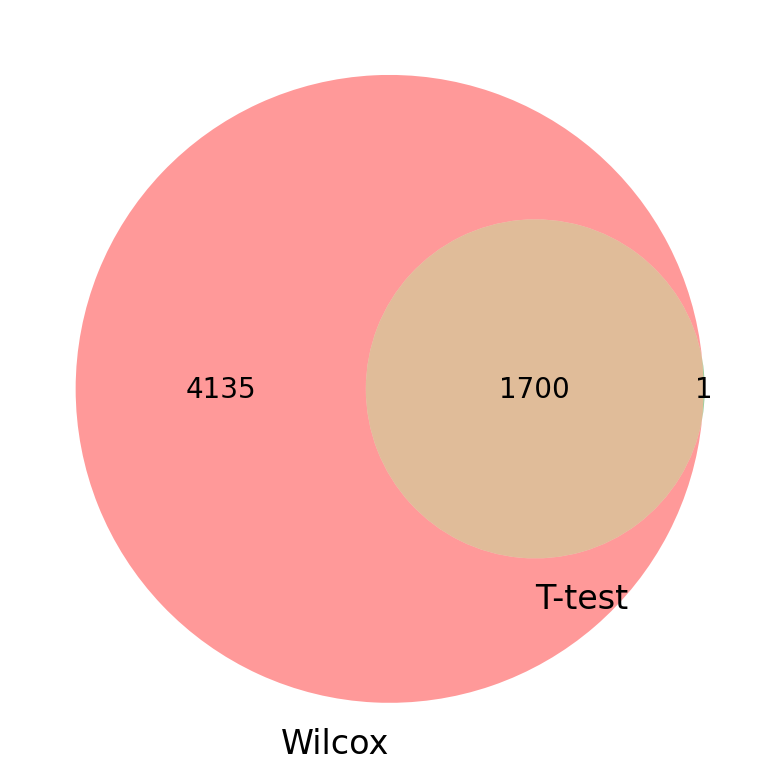

In [ ]:
#adata
wc = sc.get.rank_genes_groups_df(adata, group='0', key='wilcoxon', pval_cutoff=0.01, log2fc_min=0)['names']
tt = sc.get.rank_genes_groups_df(adata, group='0', key='t-test', pval_cutoff=0.01, log2fc_min=0)['names']

from matplotlib_venn import venn2

venn2([set(wc),set(tt)], ('Wilcox','T-test') )
plt.show()

         Falling back to preprocessing with `sc.pp.pca` and default params.


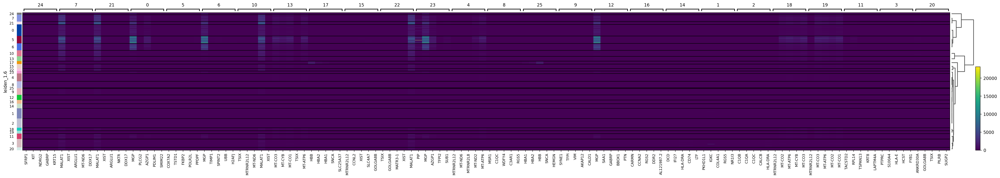

In [ ]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=5, key="wilcoxon", groupby="leiden_1.6", show_gene_labels=True)

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


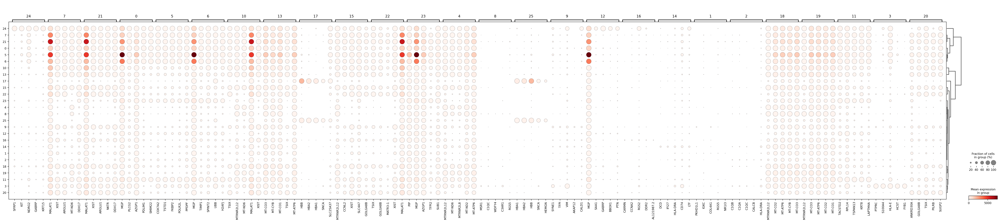

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, key="wilcoxon", groupby="leiden_1.6")

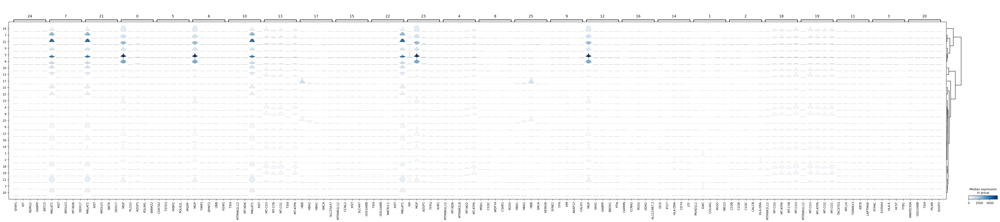

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=5, key="wilcoxon", groupby="leiden_1.6")

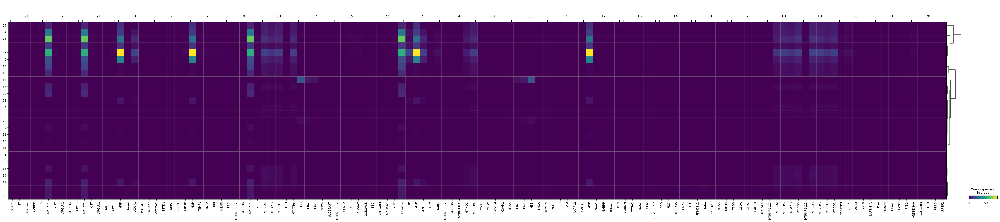

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon", groupby="leiden_1.6")